# Cluster analysis of London neighborhoods by venue types and house prices

## Nasrin Babanli

<h3>In this assignment, I have explored, segmented, and clustered the neighborhoods in the city of London by venue types and house prices. The data was taken from Wikipedia website and the main task was to scrape the Wikipedia page and wrangle the needed data, clean it, and then read it into a pandas dataframe so that it is in a structured format.<h3>

Firstly, I have imported main libraries to be used in my research project. I have used numpy library for handling vectorized data, pandas library for data analysis, json library for handling files in JSON format, Nominatim for converting address into latitude and longitude values, Folium for creating maps, Matplotlib for plotting modules and other libraries used for different needs.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!pip install geocoder
import geocoder as geocoder
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install folium
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


<h1>Stage 1<h1> 
<h2>Data Collection and Data Understanding<h2>

In this stage I have downloaded data through `wget` command in orfer to access the data.

In [2]:
!wget -q -O 'london_data.json' https://en.wikipedia.org/wiki/SW_postcode_area
print('Data downloaded!')

Data downloaded!


In [3]:
london_df = pd.read_html("https://en.wikipedia.org/wiki/List_of_areas_of_London", header=0, attrs={"class":"wikitable sortable"})[0]
london_df.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [2]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[3]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[3],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[3],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [4]:
london_df.shape

(533, 6)

In [5]:
london_df.columns

Index(['Location', 'London borough', 'Post town', 'Postcode district',
       'Dial code', 'OS grid ref'],
      dtype='object')

<h2>Data Cleansing<h2>

In [6]:
london_df.columns = ['Location','London_borough','Post town','Postcode district','Dial Code','OS grid ref']

In this stage cells with empty, i.e. non standard string values were dropped from the table.

In [7]:
london_df['London_borough'] =  london_df['London_borough'].apply(lambda x: x.replace('[','').replace(']','')) 
london_df['London_borough'] =  london_df['London_borough'].str.replace('\d+', '')
london_df['London_borough'] =  london_df['London_borough'].str.split(',').str[0]
london_df['Postcode district'] =  london_df['Postcode district'].str.split(',').str[0]
london_df['Postcode district'] =  london_df['Postcode district'].str.split('(').str[0]
london_df['Post town'] =  london_df['Post town'].str.split(',').str[0]

In [8]:
london_df.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785
1,Acton,Ealing,LONDON,W3,020,TQ205805
2,Addington,Croydon,CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728


In [9]:
london_df.to_csv('london.csv',index=False)

In [10]:
london_df.shape

(533, 6)

# Stage 2

# Getting property data of London

In [11]:
tables = pd.read_html("https://propertydata.co.uk/cities/london",header=0)
property_df=pd.DataFrame(data=tables[0])
property_df

,Area,Avg yield,Avg price,£/sqft,5yr +/-,Explore data
0,BR1,3.3%,"£439,405",£461,+21%,Explore data
1,BR2,3.4%,"£456,361",£459,+19%,Explore data
2,BR3,3.7%,"£439,013",£489,+19%,Explore data
3,BR4,-,"£555,188",£450,+17%,Explore data
4,BR5,3.2%,"£431,399",£422,+21%,Explore data
5,BR6,3.2%,"£516,755",£463,+21%,Explore data
6,BR7,-,"£579,560",£489,+18%,Explore data
7,BR8,-,"£353,087",£352,+22%,Explore data
8,CR0,4.1%,"£347,140",£433,+18%,Explore data
9,CR2,3.7%,"£378,749",£435,+16%,Explore data


In [12]:
property_df.columns

Index(['Area', 'Avg yield', 'Avg price', '£/sqft', '5yr +/-', 'Explore data'], dtype='object')

In [13]:
property_df.drop(columns=['Avg yield','£/sqft','5yr +/-','Explore data'],inplace=True)

In [14]:
property_df.head()

,Area,Avg price
0,BR1,"£439,405"
1,BR2,"£456,361"
2,BR3,"£439,013"
3,BR4,"£555,188"
4,BR5,"£431,399"


### Cleaning property data from useless characters

In [15]:
property_df['Avg price'] = property_df['Avg price'].str.replace("£","")
property_df['Avg price'] = property_df['Avg price'].str.replace(',', '')
property_df['Avg price'] = pd.to_numeric(property_df['Avg price'])

In [16]:
property_df.head()

,Area,Avg price
0,BR1,439405
1,BR2,456361
2,BR3,439013
3,BR4,555188
4,BR5,431399


In [17]:
property_df.columns=['Postcode district','Avg price']

In [18]:
property_df.columns

Index(['Postcode district', 'Avg price'], dtype='object')

In [19]:
property_df.to_csv('london_postcode.csv',index=False)

# Stage 3

# Merge the table of London Boroughs and London House Prices

In [20]:
london_data=pd.merge(london_df, property_df, how='inner', left_on='Postcode district', right_on='Postcode district')

In [21]:
london_data.columns

Index(['Location', 'London_borough', 'Post town', 'Postcode district',
       'Dial Code', 'OS grid ref', 'Avg price'],
      dtype='object')

In [22]:
london_data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,340136
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,340136
3,Acton,Ealing,LONDON,W3,020,TQ205805,531557
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140


### Getting latitude and longitude for each Postcode District

In [23]:
def getLatLong(row):
    #print('post :{}'.format(row[:]))
    #print('neigh :{}'.format(row[1]))
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, London,UK'.format(row)
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
            #print('FIRST')
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('BACKUP')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    print(latitude, longitude)
    return [latitude, longitude]

In [25]:
coords_list = london_data['Postcode district'].apply(getLatLong).tolist()

51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.492450000000076 0.12127000000003818
51.51324000000005 -0.2674599999999714
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.38475500000004 -0.051498623999975734
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.50642000000005 -0.1272099999999341
51.41009000000008 -0.05682999999993399
51.41009000000008 -0.05682999999993399
51.523610000000076 -0.09876999999994496
51.523610000000076 -0.098

### Merging latitude and longitude data with main table

In [26]:
london_data[['Latitude','Longitude']]=pd.DataFrame(coords_list,columns=['Latitude', 'Longitude'])
london_data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136,51.492450,0.121270
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,340136,51.492450,0.121270
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,340136,51.492450,0.121270
3,Acton,Ealing,LONDON,W3,020,TQ205805,531557,51.513240,-0.267460
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140,51.384755,-0.051499


In [27]:
address = 'London'

geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073219, -0.1276474.


# Create a map of London with neighborhoods

In [28]:

map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(london_data['Latitude'], london_data['Longitude'], london_data['London_borough'], london_data['Location']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)  
    
map_london

# Stage 4

# Define Foursquare Credentials

In [32]:
CLIENT_ID = 'V355PAKA2VTW5BTQUYSQG51B542QU34LAJZWNBTM2VGDKWXK' # your Foursquare ID
CLIENT_SECRET = 'CXKJANYIKQG3YXAGTHQ4OELJVDFYKOIZUHINVW114VXJFO0G' # your Foursquare Secret
VERSION = '20190922' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: V355PAKA2VTW5BTQUYSQG51B542QU34LAJZWNBTM2VGDKWXK
CLIENT_SECRET:CXKJANYIKQG3YXAGTHQ4OELJVDFYKOIZUHINVW114VXJFO0G


In [33]:
# type your answer here
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 100 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url # display URL


'https://api.foursquare.com/v2/venues/explore?&client_id=V355PAKA2VTW5BTQUYSQG51B542QU34LAJZWNBTM2VGDKWXK&client_secret=CXKJANYIKQG3YXAGTHQ4OELJVDFYKOIZUHINVW114VXJFO0G&v=20190922&ll=51.5073219,-0.1276474&radius=100&limit=100'

# Exploring venues in our dataframe

In [34]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5d8f9e5a492822003a6d923a'},
 'response': {'headerLocation': 'Westminster',
  'headerFullLocation': 'Westminster, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 10,
  'suggestedBounds': {'ne': {'lat': 51.508221900900004,
    'lng': -0.12620411691357136},
   'sw': {'lat': 51.5064218991, 'lng': -0.12909068308642863}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4ac518cef964a520f9a520e3',
       'name': 'Trafalgar Square',
       'location': {'address': 'Trafalgar Sq',
        'lat': 51.507987,
        'lng': -0.128048,
        'labeledLatLngs': [{'label': 'display',
          'lat': 51.507987,
          'lng': -0.128048}],
        'distance': 79,
        'postalCode': 'WC2N 5DX',
        'cc': 'GB',
       

### Retrieving venue names and categories with their latitude and longitudes

In [35]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [36]:

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Trafalgar Square,Plaza,51.507987,-0.128048
1,East Trafalgar Square Fountain,Fountain,51.508088,-0.127700
2,Nelson's Column,Monument / Landmark,51.507744,-0.127931
3,Trafalgar Square Lions,Outdoor Sculpture,51.507641,-0.127888
4,Trafalgar Studios,Theater,51.506651,-0.127378


In [37]:

print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

10 venues were returned by Foursquare.


# Repeating the same process to all the neighborhoods in London

In [38]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        LIMIT=100
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [39]:
london_venues = getNearbyVenues(names=london_data['Location'], 
                                   latitudes=london_data['Latitude'], 
                                   longitudes=london_data['Longitude'], 
                                   radius=500)


Abbey Wood
Crossness
West Heath
Acton
Addington
Addiscombe
Coombe
Croydon
Forestdale
New Addington
Shirley
Waddon
Woodside
Albany Park
Bexley (also Old Bexley, Bexley Village)
Dartford
Aldborough Hatch
Gants Hill
Newbury Park
Alperton
Sudbury
Wembley
Anerley
Penge
Angel
Barbican
Clerkenwell
Farringdon
Finsbury
St Luke's
Aperfield
Biggin Hill
Archway
Upper Holloway
Ardleigh Green
Emerson Park
Hornchurch
Arkley
Barnet (also Chipping Barnet, High Barnet)
Monken Hadley
Temple Fortune
Arnos Grove
Bounds Green
Brunswick Park
Colney Hatch
Friern Barnet
New Southgate
Balham
Bankside
Bermondsey
Elephant and Castle
Lambeth
Newington
Barking
Creekmouth
Barkingside
Barnehurst
Barnes
Castelnau
Barnes Cray
Crayford
Barnet Gate
The Hale
Mill Hill
Barnsbury
Canonbury
De Beauvoir Town
Hoxton
Islington
Pentonville
Shoreditch
Battersea
Bayswater
Paddington
Beckenham
Bickley
Bromley Common
Eden Park
Elmers End
Beckton
East Ham
Upton Park
Becontree
Castle Green
Dagenham
Becontree Heath
Beddington
Wallingto

In [40]:
print(london_venues.shape)
london_venues.head()

(20830, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.49245,0.12127,Sainsbury's,51.492824,0.120724,Supermarket
1,Abbey Wood,51.49245,0.12127,Lidl,51.496152,0.118417,Supermarket
2,Abbey Wood,51.49245,0.12127,Lesnes Abbey,51.489526,0.125839,Historic Site
3,Abbey Wood,51.49245,0.12127,Abbey Wood Railway Station (ABW),51.490825,0.123432,Train Station
4,Abbey Wood,51.49245,0.12127,The Abbey Arms,51.490693,0.121182,Pub



# Number of venues returned for each Neighborhood Location

In [41]:
london_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,8,8,8,8,8,8
Acton,9,9,9,9,9,9
Addington,1,1,1,1,1,1
Addiscombe,1,1,1,1,1,1
Albany Park,100,100,100,100,100,100
Aldborough Hatch,100,100,100,100,100,100
Alperton,100,100,100,100,100,100
Anerley,6,6,6,6,6,6
Angel,81,81,81,81,81,81


In [42]:

print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 313 uniques categories.


# Analyzing each Neighborhood Location

In [43]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Paintball Field,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Sri Lankan Restaurant,Stables,Statione

In [44]:
london_onehot.shape

(20830, 314)

In [45]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Paintball Field,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Sri Lankan Restaurant,Stables,Statione

In [46]:

a=london_grouped
a.head()

,Neighborhood,Afghan Restaurant,African Restaurant,American Restaurant,Antique Shop,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Garage,Auto Workshop,BBQ Joint,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bike Rental / Bike Share,Bike Shop,Bistro,Boarding House,Bookstore,Boutique,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Cable Car,Café,Camera Store,Canal,Candy Store,Caribbean Restaurant,Caucasian Restaurant,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Quad,Comedy Club,Comfort Food Restaurant,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Creperie,Cricket Ground,Cupcake Shop,Currywurst Joint,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dry Cleaner,Electronics Store,English Restaurant,Entertainment Service,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Greek Restaurant,Grilled Meat Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Hungarian Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kebab Restaurant,Kids Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical School,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Nightclub,Noodle House,North Indian Restaurant,Office,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Paintball Field,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Store,Pharmacy,Piano Bar,Pie Shop,Pier,Pilates Studio,Pizza Place,Planetarium,Platform,Playground,Plaza,Polish Restaurant,Pool,Pool Hall,Portuguese Restaurant,Print Shop,Pub,Racetrack,Radio Station,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Recruiting Agency,Rental Car Location,Reservoir,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Club,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Skate Park,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restaurant,South Indian Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Shop,Sports Bar,Sports Club,Sri Lankan Restaurant,Stables,Statione

# Top 5 most common venues for each Neighborhood

In [47]:
num_top_venues = 5

for hood in a['Neighborhood']:
    print("----"+hood+"----")
    temp = a[a['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
           venue  freq
0    Supermarket  0.25
1  Historic Site  0.12
2    Coffee Shop  0.12
3  Train Station  0.12
4            Pub  0.12


----Acton----
               venue  freq
0               Park  0.11
1  Indian Restaurant  0.11
2    Bed & Breakfast  0.11
3      Grocery Store  0.11
4                Pub  0.11


----Addington----
                           venue  freq
0                  Grocery Store   1.0
1              Afghan Restaurant   0.0
2  Paper / Office Supplies Store   0.0
3                      Pet Store   0.0
4            Peruvian Restaurant   0.0


----Addiscombe----
                           venue  freq
0                  Grocery Store   1.0
1              Afghan Restaurant   0.0
2  Paper / Office Supplies Store   0.0
3                      Pet Store   0.0
4            Peruvian Restaurant   0.0


----Albany Park----
                 venue  freq
0                Hotel  0.07
1              Theater  0.05
2               Garden  0.04
3                P

In [48]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [49]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = a['Neighborhood']

for ind in np.arange(a.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(a.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop
1,Acton,Bed & Breakfast,Pub,Gas Station,Park,Train Station,Indian Restaurant,Breakfast Spot,Convenience Store,Grocery Store,Zoo Exhibit
2,Addington,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
3,Addiscombe,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
4,Albany Park,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar


In [50]:
neighborhoods_venues_sorted.rename(columns = {'Neighborhood':'Location'}, inplace = True)

# Adding Average house price of each Neighborhood in the Group

In [51]:
#normalizing house prices
a['Price']=london_data['Avg price']
v= a.iloc[:, -1]
a.iloc[:,-1] = (v - v.min()) / (v.max() - v.min())

# Stage 5
# Clustering neighborhoods by venue types

In [52]:
#clustering neighborhoods
kclusters = 6

london_grouped_clustering = a.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 2, 2, 0, 0, 0, 0, 0, 0], dtype=int32)

In [53]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(london_grouped_clustering)
    kmeanModel.fit(london_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / london_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

<Figure size 640x480 with 1 Axes>

In [54]:
#Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = london_data

london_merged = london_merged.join(neighborhoods_venues_sorted.set_index('Location'), on='Location')

london_merged

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136,51.492450,0.121270,0,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,340136,51.492450,0.121270,3,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,340136,51.492450,0.121270,0,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop
3,Acton,Ealing,LONDON,W3,020,TQ205805,531557,51.513240,-0.267460,0,Bed & Breakfast,Pub,Gas Station,Park,Train Station,Indian Restaurant,Breakfast Spot,Convenience Store,Grocery Store,Zoo Exhibit
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
5,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
6,Coombe,Croydon,CROYDON,CR0,020,TQ342647,347140,51.384755,-0.051499,0,Pub,Italian Restaurant,Indian Restaurant,Food,Bar,Dry Cleaner,Rock Club,Pharmacy,Seafood Restaurant,Furniture / Home Store
7,Croydon,Croydon,CROYDON,CR0,020,TQ335655,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
8,Forestdale,Croydon,CROYDON,CR0,020,TQ366625,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain
9,New Addington,Croydon,CROYDON,CR0,020,TQ382622,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain


In [55]:
#droping the rows with null values
london_merged.dropna(inplace=True)

In [56]:
#Because of null values the data type of 'Cluster Labels' was changed from int to float so converting it back to int
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype(int)
london_merged.dtypes

Location                   object
London_borough             object
Post town                  object
Postcode district          object
Dial Code                  object
OS grid ref                object
Avg price                   int64
Latitude                  float64
Longitude                 float64
Cluster Labels              int64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

In [57]:
#dropping the duplicate postcodes
london_merged.drop_duplicates(subset='Postcode district',inplace=True)

In [58]:

london_merged.reset_index(inplace=True)
london_merged.drop(columns='index',inplace=True)

# Visualize the clusters

In [59]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

# Binning house prices

Creating histogram for average house prices in 7 categories.

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 <a list of 9 Text yticklabel objects>)

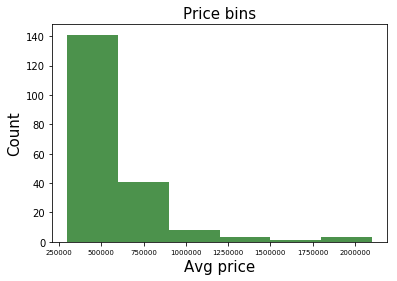

In [60]:


%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
plt.pyplot.hist(london_merged["Avg price"],bins=[300000,600000,900000,1200000,1500000,1800000,2100000], color='darkgreen',alpha=0.7)

# set x/y labels and plot title
plt.pyplot.xlabel("Avg price",fontsize=15)
plt.pyplot.ylabel("Count",fontsize=15)
plt.pyplot.title("Price bins",fontsize=15)
plt.pyplot.xticks(fontsize=7)
plt.pyplot.yticks(fontsize=10)

In [61]:
bins = np.linspace(min(london_merged["Avg price"]), max(london_merged["Avg price"]), 8)
bins

array([ 285686.        ,  516703.85714286,  747721.71428571,
        978739.57142857, 1209757.42857143, 1440775.28571429,
       1671793.14285714, 1902811.        ])

In [62]:
group_names = ['Very low price', 'Low price', 'Lower average price', 'Average price','Higher average price','High price','Very high price']

In [63]:
london_merged['Price-Categories'] = pd.cut(london_merged['Avg price'], bins, labels=group_names, include_lowest=True )
london_merged[['Avg price','Price-Categories']]

,Avg price,Price-Categories
0,340136,Very low price
1,531557,Low price
2,347140,Very low price
3,444434,Very low price
4,415454,Very low price
5,425866,Very low price
6,386709,Very low price
7,890690,Lower average price
8,438621,Very low price
9,594998,Low price


# Cluster bins

In [64]:
count, bin_edges = np.histogram(london_merged["Cluster Labels"])

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 <a list of 9 Text yticklabel objects>)

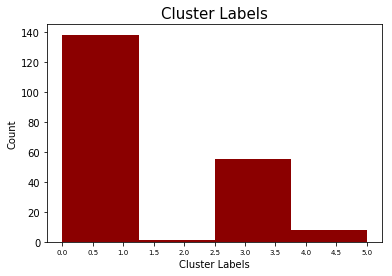

In [65]:

plt.pyplot.hist(london_merged["Cluster Labels"],bins=4, color='darkred')

# set x/y labels and plot title
plt.pyplot.xlabel("Cluster Labels", fontsize=10)
plt.pyplot.ylabel("Count", fontsize=10)
plt.pyplot.title("Cluster Labels", fontsize=15)
plt.pyplot.xticks(bin_edges, fontsize=7)
plt.pyplot.yticks(fontsize=10)

In [66]:

bins = np.linspace(min(london_merged["Cluster Labels"]), max(london_merged["Cluster Labels"]), 7)
bins

array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
       4.16666667, 5.        ])

In [67]:
group_names = ['Various Social Venues','Hotels and Social Venues','Stores and seafood restaurants','Pubs and Historic venues', 'Fitness centers','Restaurants and Bars']

In [68]:
london_merged['Cluster-Category'] = pd.cut(london_merged['Cluster Labels'], bins, labels=group_names, include_lowest=True )
london_merged[['Cluster Labels','Cluster-Category']].head()

,Cluster Labels,Cluster-Category
0,0,Various Social Venues
1,0,Various Social Venues
2,2,Stores and seafood restaurants
3,0,Various Social Venues
4,0,Various Social Venues


In [69]:
london_merged

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136,51.492450,0.121270,0,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop,Very low price,Various Social Venues
1,Acton,Ealing,LONDON,W3,020,TQ205805,531557,51.513240,-0.267460,0,Bed & Breakfast,Pub,Gas Station,Park,Train Station,Indian Restaurant,Breakfast Spot,Convenience Store,Grocery Store,Zoo Exhibit,Low price,Various Social Venues
2,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Very low price,Stores and seafood restaurants
3,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728,444434,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
4,Aldborough Hatch,Redbridge,ILFORD,IG2,020,TQ455895,415454,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
5,Alperton,Brent,WEMBLEY,HA0,020,TQ185835,425866,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
6,Anerley,Bromley,LONDON,SE20,020,TQ345695,386709,51.410090,-0.056830,0,Supermarket,Fast Food Restaurant,Hotel,Grocery Store,Convenience Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Very low price,Various Social Venues
7,Angel,Islington,LONDON,EC1,020,TQ345665,890690,51.523610,-0.098770,0,Pub,Coffee Shop,Food Truck,Italian Restaurant,Hotel,Café,Vietnamese Restaurant,Park,Gym / Fitness Center,Turkish Restaurant,Lower average price,Various Social Venues
8,Aperfield,Bromley,WESTERHAM,TN16,01959,TQ425585,438621,51.271726,0.074710,0,Gas Station,Historic Site,Garden Center,Food Truck,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Very low price,Various Social Venues
9,Archway,Islington,LONDON,N19,020,TQ285875,594998,51.563930,-0.129450,0,Coffee Shop,Grocery Store,Pub,Italian Restaurant,Pizza Place,Park,Vegetarian / Vegan Restaurant,Farmers Market,Hotel,Fast Food Restaurant,Low price,Various Social Venues


# Stage 6

# Examining the Clusters

## Cluster 1

In [70]:
london_merged[london_merged['Cluster Labels']==0]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136,51.492450,0.121270,0,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop,Very low price,Various Social Venues
1,Acton,Ealing,LONDON,W3,020,TQ205805,531557,51.513240,-0.267460,0,Bed & Breakfast,Pub,Gas Station,Park,Train Station,Indian Restaurant,Breakfast Spot,Convenience Store,Grocery Store,Zoo Exhibit,Low price,Various Social Venues
3,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728,444434,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
4,Aldborough Hatch,Redbridge,ILFORD,IG2,020,TQ455895,415454,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
5,Alperton,Brent,WEMBLEY,HA0,020,TQ185835,425866,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
6,Anerley,Bromley,LONDON,SE20,020,TQ345695,386709,51.410090,-0.056830,0,Supermarket,Fast Food Restaurant,Hotel,Grocery Store,Convenience Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Very low price,Various Social Venues
7,Angel,Islington,LONDON,EC1,020,TQ345665,890690,51.523610,-0.098770,0,Pub,Coffee Shop,Food Truck,Italian Restaurant,Hotel,Café,Vietnamese Restaurant,Park,Gym / Fitness Center,Turkish Restaurant,Lower average price,Various Social Venues
8,Aperfield,Bromley,WESTERHAM,TN16,01959,TQ425585,438621,51.271726,0.074710,0,Gas Station,Historic Site,Garden Center,Food Truck,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Very low price,Various Social Venues
9,Archway,Islington,LONDON,N19,020,TQ285875,594998,51.563930,-0.129450,0,Coffee Shop,Grocery Store,Pub,Italian Restaurant,Pizza Place,Park,Vegetarian / Vegan Restaurant,Farmers Market,Hotel,Fast Food Restaurant,Low price,Various Social Venues
10,Ardleigh Green,Havering,HORNCHURCH,RM11,01708,TQ535895,528469,51.583700,0.174760,0,Café,Electronics Store,Music Store,Furniture / Home Store,Convenience Store,Zoo Exhibit,French Restaurant,Food & Drink Shop,Food Court,Food Stand,Low price,Various Social Venues


## Cluster 2


In [71]:
london_merged[london_merged['Cluster Labels']==1]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
11,Arkley,Barnet,BARNET,EN5,020,TQ225955,621677,51.644415,-0.179185,1,Pub,Recruiting Agency,Coffee Shop,Zoo Exhibit,Food Truck,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Low price,Hotels and Social Venues
17,Barnehurst,Bexley,BEXLEYHEATH,DA7,01322,TQ505755,443553,51.470520,0.146706,1,Pub,Indian Restaurant,Convenience Store,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Very low price,Hotels and Social Venues
19,Barnes Cray,Bexley,DARTFORD,DA1,01322,TQ525755,288170,51.452068,0.172230,1,Pub,Mediterranean Restaurant,Track Stadium,Supermarket,Italian Restaurant,Gaming Cafe,Flea Market,Garden,Flower Shop,Food,Very low price,Hotels and Social Venues
39,Blackheath,Lewisham,LONDON,SE3,020,TQ395765,529209,51.471380,0.023380,1,Pub,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Low price,Hotels and Social Venues
41,Botany Bay,Enfield,ENFIELD,EN2,020,TQ297992,553345,51.653660,-0.110614,1,Flower Shop,Lake,Pub,Zoo Exhibit,French Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Low price,Hotels and Social Venues
42,Bow,Tower Hamlets,LONDON,E3,020,TQ365825,436860,51.527020,-0.025940,1,Pub,Bus Stop,Bar,Burger Joint,Light Rail Station,Grocery Store,Locksmith,Zoo Exhibit,Fried Chicken Joint,Food Court,Very low price,Hotels and Social Venues
79,Cranham,Havering,UPMINSTER,RM14,01708,TQ575875,546309,51.543074,0.250114,1,Pub,Park,Zoo Exhibit,Fountain,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Low price,Hotels and Social Venues
91,East Dulwich,Southwark,LONDON,SE22,020,TQ345745,597379,51.452560,-0.070760,1,Pub,Bar,Bus Stop,Grocery Store,Gastropub,Donut Shop,Frozen Yogurt Shop,Food Court,Food Stand,Food Truck,Low price,Hotels and Social Venues
103,Foots Cray,Bexley,SIDCUP,DA14,020,TQ472709,353611,51.452068,0.172230,1,Pub,Mediterranean Restaurant,Track Stadium,Supermarket,Italian Restaurant,Gaming Cafe,Flea Market,Garden,Flower Shop,Food,Very low price,Hotels and Social Venues
132,Highgate,Camden,LONDON,N6,020,TQ285875,847619,51.571450,-0.149830,1,Pub,Bakery,French Restaurant,Park,Bus Stop,Gastropub,Pool,Indian Restaurant,Tea Room,Plaza,Lower average price,Hotels and Social Venues


## Cluster 3

In [72]:
london_merged[london_merged['Cluster Labels']==2]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
2,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Very low price,Stores and seafood restaurants


## Cluster 4

In [73]:
london_merged[london_merged['Cluster Labels']==3]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
21,Barnsbury,Islington,LONDON,N1,020,TQ305845,763842,51.537920,-0.099830,3,Pub,French Restaurant,Mediterranean Restaurant,Bakery,Burger Joint,Restaurant,Frozen Yogurt Shop,Mexican Restaurant,Furniture / Home Store,Gastropub,Lower average price,Pubs and Historic venues
22,Battersea,Wandsworth,LONDON,SW11,020,TQ285765,844753,51.467600,-0.162900,3,Café,Pub,Supermarket,Indian Restaurant,Bar,Restaurant,Breakfast Spot,Seafood Restaurant,Grocery Store,Gym,Lower average price,Pubs and Historic venues
23,Bayswater,Westminster,LONDON,W2,020,TQ255805,1042649,51.514940,-0.180480,3,Hotel,Coffee Shop,Café,Pub,Italian Restaurant,Garden,Greek Restaurant,Restaurant,French Restaurant,Hostel,Average price,Pubs and Historic venues
24,Beckenham,Bromley,BECKENHAM,BR3,020,TQ375695,439013,51.415095,-0.035403,3,Athletics & Sports,Gym / Fitness Center,Park,Flea Market,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Very low price,Pubs and Historic venues
25,Beckton,Newham,LONDON,E6,020,TQ435815,354614,51.532920,0.054610,3,Discount Store,Clothing Store,Pub,Coffee Shop,Café,Gym Pool,Bakery,Fast Food Restaurant,Sandwich Place,Park,Very low price,Pubs and Historic venues
26,Becontree,Barking and Dagenham,DAGENHAM,RM9,020,TQ485855,314695,51.506420,-0.127210,3,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Pubs and Historic venues
29,Bedford Park,Ealing,LONDON,W4,020,TQ208793,706242,51.489440,-0.261940,3,Italian Restaurant,Pub,Bookstore,Bakery,Café,Supermarket,Coffee Shop,Organic Grocery,Burger Joint,Gift Shop,Low price,Pubs and Historic venues
31,Bellingham,Lewisham,LONDON,SE6,020,TQ375715,396247,51.437220,-0.018680,3,Bus Station,Discount Store,Train Station,Turkish Restaurant,Grocery Store,Fountain,Flower Shop,Food,Food & Drink Shop,Food Court,Very low price,Pubs and Historic venues
35,Belvedere,Bexley,BELVEDERE,DA17,020,TQ495785,288422,51.485470,0.143007,3,Grocery Store,Pub,Fast Food Restaurant,Tea Room,Bar,Indian Restaurant,Trail,Playground,Convenience Store,Zoo Exhibit,Very low price,Pubs and Historic venues
37,Bethnal Green,Tower Hamlets,LONDON,E2,020,TQ345825,612641,51.526690,-0.062570,3,Coffee Shop,Café,Pub,Japanese Restaurant,Falafel Restaurant,Music Store,Brewery,Cocktail Bar,Grocery Store,Gym,Low price,Pubs and Historic venues


## Cluster 5

In [74]:
london_merged[london_merged['Cluster Labels']==4]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
70,Cockfosters,Barnet,BARNET,EN4,020,TQ275965,758581,51.506420,-0.127210,4,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Lower average price,Fitness centers
71,Colindale,Barnet,LONDON,NW9,020,TQ213897,446120,51.584860,-0.248810,4,Bus Stop,Asian Restaurant,Coffee Shop,Café,Supermarket,Sushi Restaurant,Hookah Bar,Hotel,Auto Workshop,Ice Cream Shop,Very low price,Fitness centers
72,Colliers Wood,Merton,LONDON,SW19,020,TQ275705,599197,51.421700,-0.207960,4,Pub,Bar,Coffee Shop,Sushi Restaurant,Clothing Store,Sandwich Place,Burger Joint,Supermarket,Grocery Store,Indian Restaurant,Low price,Fitness centers
73,Colyers,Bexley,ERITH,DA8,01322,TQ512768,292675,51.506420,-0.127210,4,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Fitness centers
109,Gallows Corner,Havering,ROMFORD,RM2,01708,TQ535905,529435,51.475870,0.276066,4,Indian Restaurant,Clothing Store,Fast Food Restaurant,Pub,French Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Low price,Fitness centers
128,Harrow,Harrow,HARROW,HA1,020,TQ145885,432092,51.567891,-0.339483,4,Italian Restaurant,Coffee Shop,Café,Gastropub,Pub,Bar,French Restaurant,Fountain,Food,Food & Drink Shop,Very low price,Fitness centers
184,South Woodford,Redbridge,LONDON,E18,020,TQ405905,469423,51.589770,0.030520,4,Yoga Studio,Seafood Restaurant,Pub,Bar,BBQ Joint,Zoo Exhibit,Food Truck,Flower Shop,Food,Food & Drink Shop,Very low price,Fitness centers


## Cluster 6

In [75]:
london_merged[london_merged['Cluster Labels']==5]

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
50,Bromley,Bromley,BROMLEY,BR1,020,TQ405695,439405,51.41671,0.009042,5,Print Shop,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Very low price,Restaurants and Bars


# Examining Property prices

In [76]:
london_merged[london_merged['Price-Categories']=='Very high price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
64,Chinatown,Westminster,LONDON,W1,020,TQ395895,1902811,51.51648,-0.14816,0,Coffee Shop,Burger Joint,Italian Restaurant,Hotel,Juice Bar,French Restaurant,Clothing Store,Café,Sandwich Place,Cosmetics Shop,Very high price,Various Social Venues
134,Holland Park,Kensington and Chelsea,LONDON,W8,020,TQ246798,1810374,51.50162,-0.19173,3,Hotel,Clothing Store,Café,Pub,Restaurant,Palace,French Restaurant,Chinese Restaurant,Garden,Grocery Store,Very high price,Pubs and Historic venues
142,Kensington,Kensington and Chelsea,LONDON,SW7,020,TQ255795,1846109,51.49807,-0.17404,0,Café,Exhibit,Science Museum,Hotel,Bakery,Garden,Italian Restaurant,Burger Joint,Pub,Sandwich Place,Very high price,Various Social Venues


In [77]:
london_merged[london_merged['Price-Categories']=='High price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
51,Brompton,Kensington and ChelseaHammersmith and Fulham,LONDON,SW3,020,TQ275795,1630903,51.49014,-0.16248,3,Hotel,Pub,Italian Restaurant,Café,Bakery,Japanese Restaurant,Gym / Fitness Center,English Restaurant,Coffee Shop,Clothing Store,High price,Pubs and Historic venues


In [78]:
london_merged[london_merged['Price-Categories']=='Higher average price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
30,Belgravia,Westminster,LONDON,SW1,020,TQ275795,1427471,51.49713,-0.13829,0,Coffee Shop,Hotel,Sandwich Place,Theater,Sushi Restaurant,Italian Restaurant,Hotel Bar,Juice Bar,Burger Joint,Café,Higher average price,Various Social Venues
147,Lisson Grove,Westminster,LONDON,NW8,020,TQ275825,1233460,51.53398,-0.17378,0,Café,Coffee Shop,Deli / Bodega,Cricket Ground,Gastropub,Clothing Store,Gift Shop,Monument / Landmark,Modern European Restaurant,Bakery,Higher average price,Various Social Venues
163,Notting Hill,Kensington and Chelsea,LONDON,W11,020,TQ245805,1214972,51.51244,-0.20639,3,Italian Restaurant,Pub,Coffee Shop,Bakery,Clothing Store,Bookstore,Café,Bar,Boutique,Breakfast Spot,Higher average price,Pubs and Historic venues


In [79]:
london_merged[london_merged['Price-Categories']=='Average price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
18,Barnes,Richmond upon Thames,LONDON,SW13,020,TQ225765,982729,51.47457,-0.24212,0,Pizza Place,Italian Restaurant,Café,Farmers Market,Pub,Park,Restaurant,Coffee Shop,Food & Drink Shop,Bookstore,Average price,Various Social Venues
23,Bayswater,Westminster,LONDON,W2,020,TQ255805,1042649,51.51494,-0.18048,3,Hotel,Coffee Shop,Café,Pub,Italian Restaurant,Garden,Greek Restaurant,Restaurant,French Restaurant,Hostel,Average price,Pubs and Historic venues
34,Belsize Park,Camden,LONDON,NW3,020,TQ273845,1082435,51.55506,-0.17348,0,Pub,Café,Bakery,Italian Restaurant,Pizza Place,Indian Restaurant,Ice Cream Shop,Museum,Creperie,French Restaurant,Average price,Various Social Venues
88,Earls Court,Kensington and Chelsea,LONDON,SW5,020,TQ254784,1070188,51.49004,-0.18971,0,Hotel,Café,Pizza Place,Garden,Indian Restaurant,Coffee Shop,Cocktail Bar,Grocery Store,Chinese Restaurant,Tapas Restaurant,Average price,Various Social Venues
93,East Sheen,Richmond upon Thames,LONDON,SW14,020,TQ205755,1025496,51.46482,-0.26591,3,Coffee Shop,Pub,Grocery Store,Pizza Place,Stationery Store,Middle Eastern Restaurant,Supermarket,Creperie,Chinese Restaurant,Beer Store,Average price,Pubs and Historic venues
195,West Brompton,Kensington and Chelsea,LONDON,SW10,020,TQ253779,1065907,51.48563,-0.18144,0,Italian Restaurant,Restaurant,Grocery Store,French Restaurant,Cocktail Bar,Asian Restaurant,Bakery,Gourmet Shop,Juice Bar,Diner,Average price,Various Social Venues


In [80]:
london_merged[london_merged['Price-Categories']=='Lower average price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
7,Angel,Islington,LONDON,EC1,020,TQ345665,890690,51.52361,-0.098770,0,Pub,Coffee Shop,Food Truck,Italian Restaurant,Hotel,Café,Vietnamese Restaurant,Park,Gym / Fitness Center,Turkish Restaurant,Lower average price,Various Social Venues
14,Bankside,Southwark,LONDON,SE1,020,TQ325795,957235,51.49960,-0.096130,0,Pub,Coffee Shop,Café,Sandwich Place,Theater,Argentinian Restaurant,Park,Garden,Indian Restaurant,Gym / Fitness Center,Lower average price,Various Social Venues
21,Barnsbury,Islington,LONDON,N1,020,TQ305845,763842,51.53792,-0.099830,3,Pub,French Restaurant,Mediterranean Restaurant,Bakery,Burger Joint,Restaurant,Frozen Yogurt Shop,Mexican Restaurant,Furniture / Home Store,Gastropub,Lower average price,Pubs and Historic venues
22,Battersea,Wandsworth,LONDON,SW11,020,TQ285765,844753,51.46760,-0.162900,3,Café,Pub,Supermarket,Indian Restaurant,Bar,Restaurant,Breakfast Spot,Seafood Restaurant,Grocery Store,Gym,Lower average price,Pubs and Historic venues
56,Camden Town,Camden,LONDON,NW1,020,TQ295845,874082,51.53354,-0.146060,3,Zoo Exhibit,Coffee Shop,Pub,Music Venue,Japanese Restaurant,Café,Deli / Bodega,Pedestrian Plaza,Park,Sushi Restaurant,Lower average price,Pubs and Historic venues
70,Cockfosters,Barnet,BARNET,EN4,020,TQ275965,758581,51.50642,-0.127210,4,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Lower average price,Fitness centers
107,Fulham,Hammersmith and Fulham,LONDON,SW6,020,TQ245765,838002,51.47772,-0.201450,0,Coffee Shop,Café,Pub,Italian Restaurant,French Restaurant,Gastropub,Yoga Studio,Grocery Store,Park,Thai Restaurant,Lower average price,Various Social Venues
110,Golders Green,Barnet,LONDON,NW11,020,TQ248876,785398,51.57673,-0.196950,3,Grocery Store,Italian Restaurant,Café,Korean Restaurant,Bakery,Turkish Restaurant,BBQ Joint,Falafel Restaurant,Pharmacy,Sandwich Place,Lower average price,Pubs and Historic venues
119,Ham,Richmond upon Thames,RICHMOND,TW10,020,TQ175725,772873,51.44075,-0.282088,0,Lake,Tree,Zoo Exhibit,Fountain,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Lower average price,Various Social Venues
120,Hammersmith,Hammersmith and Fulham,LONDON,W6,020,TQ233786,830087,51.49617,-0.229350,0,Pub,Hotel,Sandwich Place,Coffee Shop,Clothing Store,Fast Food Restaurant,Cocktail Bar,Gym / Fitness Center,Gastropub,Portuguese Restaurant,Lower average price,Various Social Venues


In [81]:
london_merged[london_merged['Price-Categories']=='Low price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
1,Acton,Ealing,LONDON,W3,020,TQ205805,531557,51.513240,-0.267460,0,Bed & Breakfast,Pub,Gas Station,Park,Train Station,Indian Restaurant,Breakfast Spot,Convenience Store,Grocery Store,Zoo Exhibit,Low price,Various Social Venues
9,Archway,Islington,LONDON,N19,020,TQ285875,594998,51.563930,-0.129450,0,Coffee Shop,Grocery Store,Pub,Italian Restaurant,Pizza Place,Park,Vegetarian / Vegan Restaurant,Farmers Market,Hotel,Fast Food Restaurant,Low price,Various Social Venues
10,Ardleigh Green,Havering,HORNCHURCH,RM11,01708,TQ535895,528469,51.583700,0.174760,0,Café,Electronics Store,Music Store,Furniture / Home Store,Convenience Store,Zoo Exhibit,French Restaurant,Food & Drink Shop,Food Court,Food Stand,Low price,Various Social Venues
11,Arkley,Barnet,BARNET,EN5,020,TQ225955,621677,51.644415,-0.179185,1,Pub,Recruiting Agency,Coffee Shop,Zoo Exhibit,Food Truck,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Low price,Hotels and Social Venues
12,Arnos Grove,Enfield,LONDON,N11,020,TQ295925,519883,51.616310,-0.138390,0,Grocery Store,Bus Stop,Fish & Chips Shop,Train Station,Convenience Store,Gym,Metro Station,Food Stand,Flower Shop,Garden Center,Low price,Various Social Venues
13,Balham,Wandsworth,LONDON,SW12,020,TQ285735,691258,51.448220,-0.148390,0,Coffee Shop,Grocery Store,Pub,Breakfast Spot,Indian Restaurant,Fast Food Restaurant,Bakery,Burger Joint,Shop & Service,Cocktail Bar,Low price,Various Social Venues
20,Barnet Gate,Barnet,LONDON,NW7,020,TQ218952,687973,51.615680,-0.245110,0,Bus Stop,Italian Restaurant,Pizza Place,Stationery Store,Chinese Restaurant,Grocery Store,Coffee Shop,Gym / Fitness Center,Salon / Barbershop,Pharmacy,Low price,Various Social Venues
29,Bedford Park,Ealing,LONDON,W4,020,TQ208793,706242,51.489440,-0.261940,3,Italian Restaurant,Pub,Bookstore,Bakery,Café,Supermarket,Coffee Shop,Organic Grocery,Burger Joint,Gift Shop,Low price,Pubs and Historic venues
36,Berrylands,Kingston upon Thames,SURBITON,KT5,020,TQ195675,556613,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Low price,Various Social Venues
37,Bethnal Green,Tower Hamlets,LONDON,E2,020,TQ345825,612641,51.526690,-0.062570,3,Coffee Shop,Café,Pub,Japanese Restaurant,Falafel Restaurant,Music Store,Brewery,Cocktail Bar,Grocery Store,Gym,Low price,Pubs and Historic venues


In [82]:
london_merged[london_merged['Price-Categories']=='Very low price']

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,340136,51.492450,0.121270,0,Supermarket,Coffee Shop,Convenience Store,Pub,Historic Site,Train Station,Platform,Fish Market,Flea Market,Flower Shop,Very low price,Various Social Venues
2,Addington,Croydon,CROYDON,CR0,020,TQ375645,347140,51.384755,-0.051499,2,Grocery Store,Zoo Exhibit,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fountain,Very low price,Stores and seafood restaurants
3,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728,444434,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
4,Aldborough Hatch,Redbridge,ILFORD,IG2,020,TQ455895,415454,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
5,Alperton,Brent,WEMBLEY,HA0,020,TQ185835,425866,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
6,Anerley,Bromley,LONDON,SE20,020,TQ345695,386709,51.410090,-0.056830,0,Supermarket,Fast Food Restaurant,Hotel,Grocery Store,Convenience Store,Zoo Exhibit,Fountain,Food,Food & Drink Shop,Food Court,Very low price,Various Social Venues
8,Aperfield,Bromley,WESTERHAM,TN16,01959,TQ425585,438621,51.271726,0.074710,0,Gas Station,Historic Site,Garden Center,Food Truck,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Very low price,Various Social Venues
15,Barking,Barking and Dagenham,BARKING,IG11,020,TQ440840,297071,51.533120,0.084077,0,Grocery Store,Plaza,Spa,Supermarket,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Very low price,Various Social Venues
16,Barkingside,Redbridge,ILFORD,IG6,020,TQ445895,425916,51.506420,-0.127210,0,Hotel,Theater,Plaza,Garden,Wine Bar,Monument / Landmark,Art Gallery,Mexican Restaurant,Sandwich Place,Cocktail Bar,Very low price,Various Social Venues
17,Barnehurst,Bexley,BEXLEYHEATH,DA7,01322,TQ505755,443553,51.470520,0.146706,1,Pub,Indian Restaurant,Convenience Store,French Restaurant,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Very low price,Hotels and Social Venues
